---

<h1 style="color:#012eba">Introduction to Image Processing with Python</h1>
<h1 style="color:#012eba">Episode 9: Template Matching</h1>

---

*DASCI 261 - Introduction to Image Processing*

*Prepared by Erika G. Lacson*

---

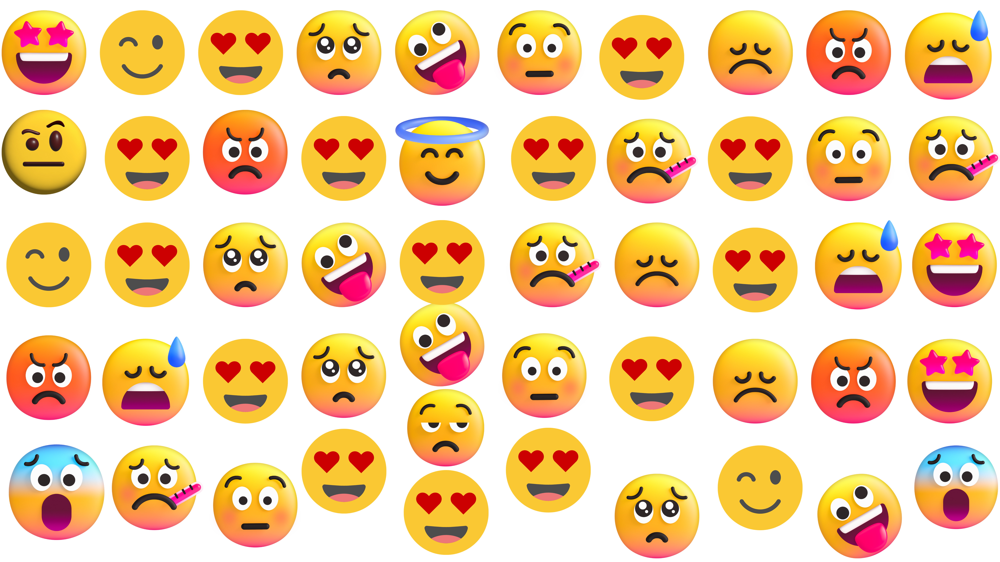

Emojis compiled by the Author.


---
<h2 style="color:#ff0090">Introduction</h2>

Hello, fellow explorers! 🚀 Here we are, at the grand finale of our image processing series. In this closing episode, we’ll be exploring a method that’s integral to object detection and tracking — <b>Template Matching</b>. It’s all about finding patterns in a larger canvas, and it’s as exciting as it sounds. So, without further ado, let’s jump right in! 🙌

---
<h2 style="color:#ff0090">Template Matching</h2>

<b>Template Matching</b> is like finding Waldo in a crowded scene — we have a reference image (Waldo), and we want to find it in a larger image (the crowd).

The algorithm for template matching is straightforward: it compares the template to each part of the source image, sliding pixel by pixel. The result is a correlation map where each pixel value reflects how similar the template is to that location in the source image.

In practice, actual implementations of template matching differ based on the measure of similarity and methods for efficient multiple comparisons. But no worries, I’ll break it down for you. 🧐

As always, let’s import the necessary libraries:

In [1]:
# Import libraries
import numpy as np
import matplotlib.pyplot as plt
from skimage.io import imread, imshow
from skimage.color import rgb2gray
from skimage.feature import match_template
from skimage.feature import peak_local_max

Let's illustrate this with an example featuring emojis (because who doesn't love emojis, right?). 🤩

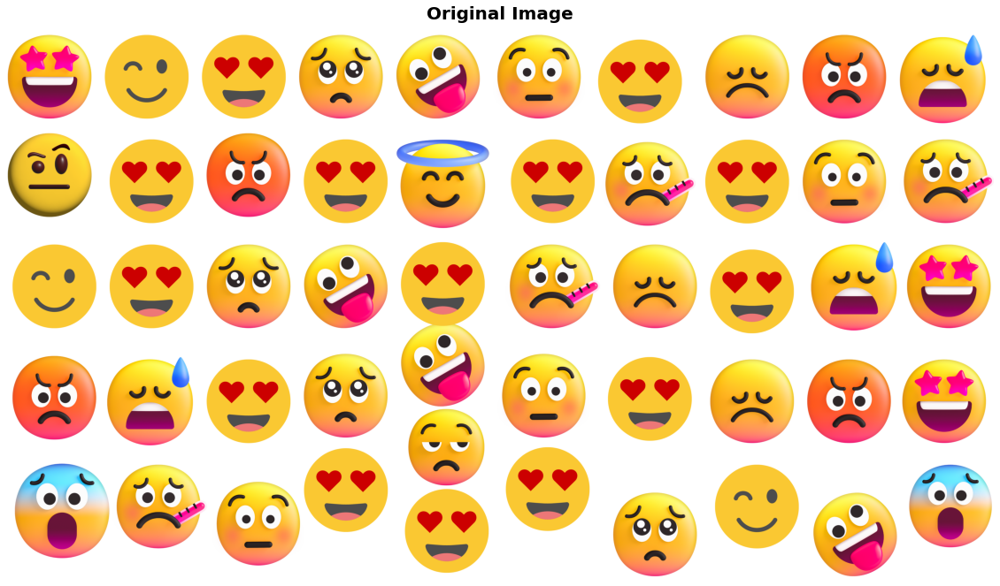

In [2]:
original_image = imread('emojis.png')
plt.figure(figsize=(20,20))
plt.imshow(original_image)
plt.title('Original Image', fontsize=20, weight='bold')
plt.axis('off')
plt.show()

Original Image. Photo by Author.

While template matching works with color images, let's simplify things and convert our image to grayscale.

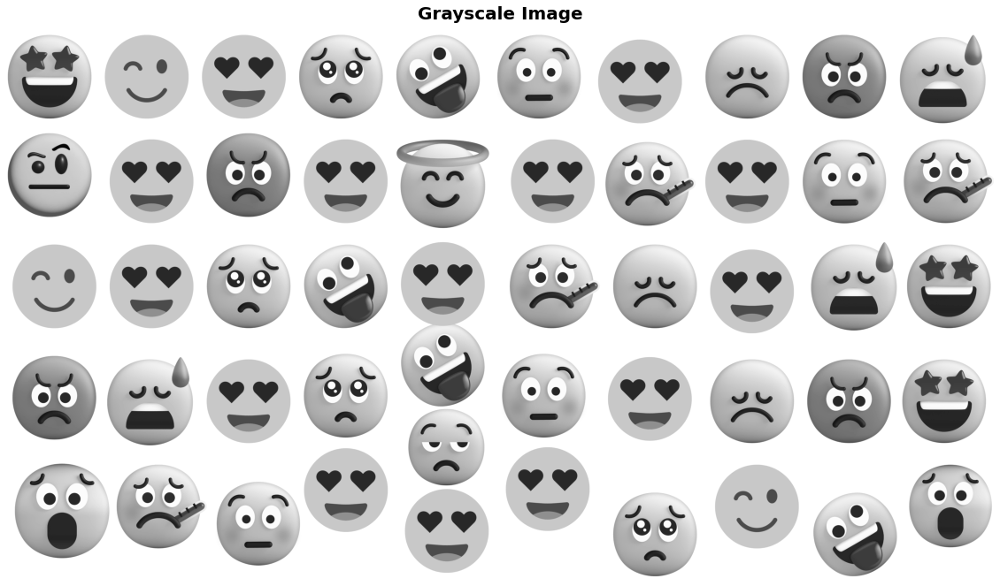

In [3]:
# Convert the image to grayscale
gray_image = rgb2gray(original_image[:,:,:3])
plt.figure(figsize=(20,20))
plt.imshow(gray_image, cmap='gray')
plt.title('Grayscale Image', fontsize=20, weight='bold')
plt.axis('off')
plt.show()

Grayscale Image. Photo by Author.

Now, let's choose a single emoji as our template:

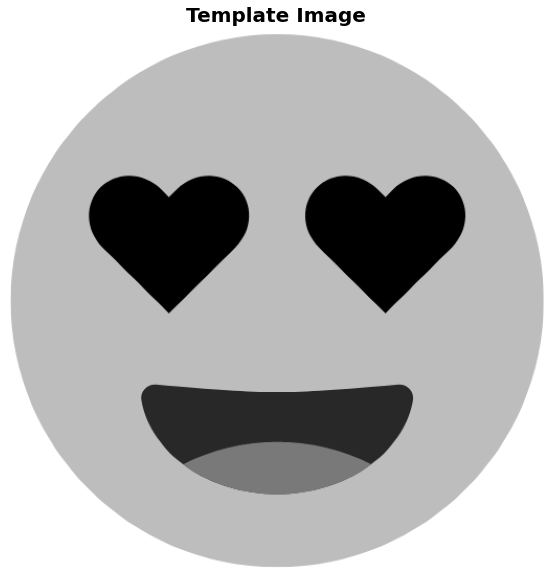

In [4]:
template = gray_image[1330:1850,625:1140]
plt.figure(figsize=(10,10))
plt.imshow(template, cmap='gray')
plt.title('Template Image', fontsize=20, weight='bold')
plt.axis('off')
plt.show();

Template Image. Photo by Author.

By using `match_template`, we perform the template matching.

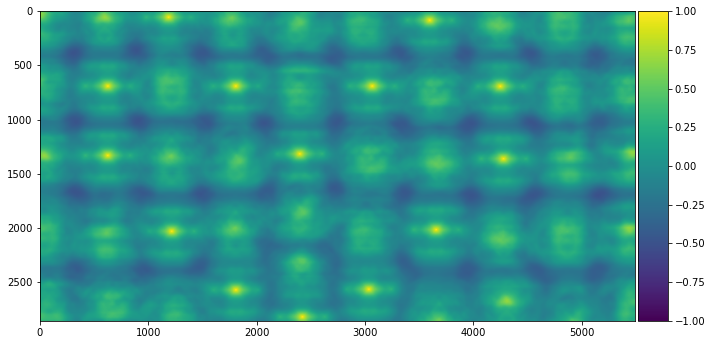

In [5]:
result = match_template(gray_image, template)
plt.figure(figsize=(10,10))
imshow(result, cmap='viridis')
plt.show();

Template Matching Results. Photo by Author.

The result? Brightly colored areas showing where our template might be found.👀 Did you notice the shape formed by the bright colored areas?

If we assume that the template is found only once in the source image then we can find where it is by looking for the pixel with the highest value (~1.00).

Now let's pinpoint the exact location.

In [6]:
x, y = np.unravel_index(np.argmax(result), result.shape)
print((x, y))

(1330, 625)


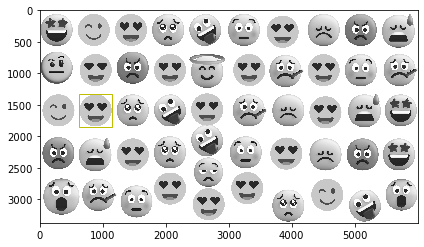

In [7]:
imshow(gray_image)
template_width, template_height = template.shape
rect = plt.Rectangle((y, x), template_height, template_width, color='y', 
                     fc='none')
plt.gca().add_patch(rect);

Single Template found in the image. Photo by Author.

To locate multiple matches of a template, we search for peaks that have a certain value for correlation.

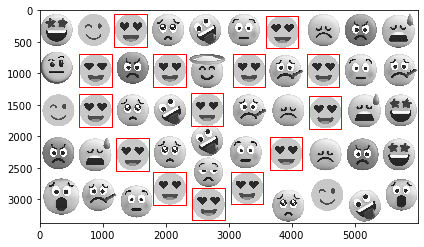

In [22]:
imshow(gray_image)
template_width, template_height = template.shape
for x, y in peak_local_max(result, threshold_abs=0.99):
    rect = plt.Rectangle((y, x), template_height, template_width, color='red', 
                         fc='none')
    plt.gca().add_patch(rect);

Template Matches in the Grayscale Image. Photo by Author.

Voila! We've found our heart eyes emoji in the crowd! 🎉 

Finally, let's stack it on our colored image:

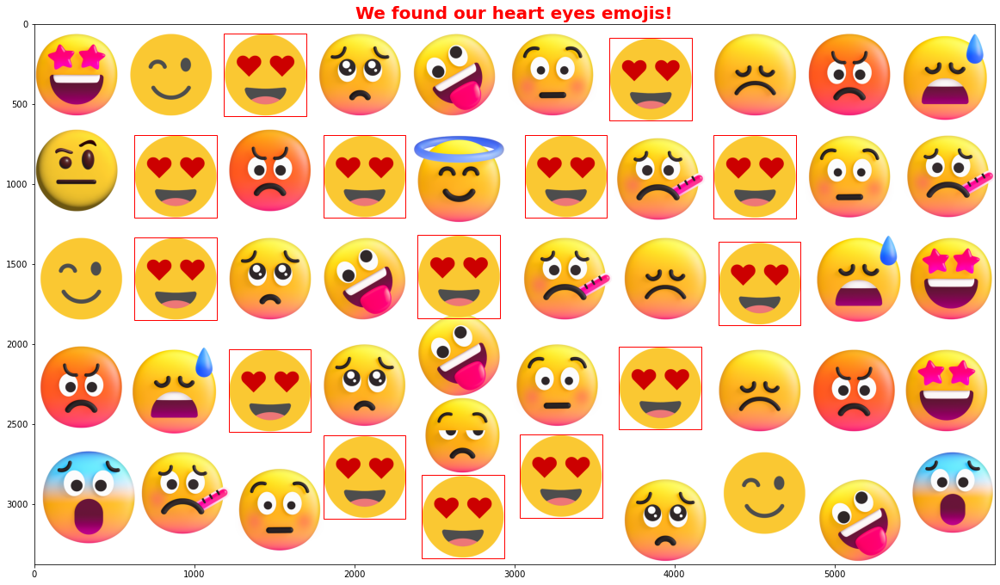

In [23]:
plt.figure(figsize=(20, 20))
plt.imshow(original_image)
plt.title('We found our heart eyes emojis!', fontsize=20, weight='bold', color='red')
template_width, template_height = template.shape
for x, y in peak_local_max(result, threshold_abs=0.99):
    rect = plt.Rectangle((y, x), template_height, template_width, color='red', 
                         fc='none')
    plt.gca().add_patch(rect);

Template Matches in the Original Image. Photo by Author.

---
<h2 style="color:#ff0090">Exploring Further 🔍</h2>

- What happens if we <b>change the threshold</b>? Lowering the threshold will give us more matches (but also more <b>false positives</b>), while raising it will make the matches fewer but potentially more accurate.
- How about <b>enlarging the template</b>? The larger the template, the <b>fewer</b> matches we’ll get. That’s because the match must be nearly identical in size to the template.
- <b>Flipping the template</b>? This would likely result in <b>no matches</b>, as template matching is sensitive to orientation.
- <b>Changing the image contrast</b>? As long as the template and the source image change similarly, the matches should remain valid. However, drastic changes may alter the results.
You can test it out to confirm. :)

---
<h2 style="color:#ff0090">Conclusion 🏁</h2>

And with that, we’ve reached the end of our image processing journey. We’ve traversed through fascinating landscapes of pixels and matrices, unlocked the secrets of colors, shapes, and transformations, and have seen firsthand how these simple concepts can bring images to life.

I hope this series has sparked your curiosity to explore the vast universe of image processing further. Remember, every ending is just the beginning of a new adventure. So, keep learning, stay curious, and continue to push the boundaries of your imagination.

Thank you for joining me on this journey! 🙌 Until our next adventure, keep coding, keep exploring! 💻🚀🎉

---
<h2 style="color:#ff0090">References</h2>

- Borja, B. (2023). Lecture 9 - Special Topics in Image Processing Part 2 [Jupyter Notebook]. Introduction to Image Processing 2023, Asian Institute of Management.